In [3]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.image as mgimg
import matplotlib.colors as colors
import scipy as sp
import numpy as np
import emcee
import os 
from collections import namedtuple
import settings
import utils
import test_module
import retrieval_run
import corner
import pickle as pickle
import TPmod
import brewtools
from IPython.display import display
%matplotlib inline

# MCMC

In [50]:
path = "/Users/fw23aao/brewsteretrieval/brewster/"

runname = "mcmc_test_G570D_clear"

# OK finish? 1 for yes, 0 for no.
fin = 1
flatendchain, flatendprobs,ndim = brewtools.get_endchain(runname,fin,path)
theta_max_end = flatendchain[np.argmax(flatendprobs)]
max_end_like = np.amax(flatendprobs)
samples = flatendchain

argfile =path+runname+"_runargs.pic"
runargs = brewtools.pickle_load(argfile)
settings.init(runargs)


with open(path+runname+'_configs.pkl', 'rb') as file:
    configs= pickle.load(file)
    
re_params=configs['re_params']
model_config_instance=configs['model_config']

maximum likelihood =  4322.858384295735
maximum likelihood in final 2K iterations=  4322.479302561849


N/50 = 1000;
tau: [1498.11204891 1091.86173677 1358.48865322 1537.57531488 1369.59649326
 1071.90995138 1540.96842251 1703.24539897 1891.17054995 1328.99815076
 1537.77538204 1834.06436669 1098.99898303 1134.17405171 1145.99938913
 1122.0710028  1069.46938541 1023.39001824 1064.59283756 1327.76775309
 1717.35536959 1866.69586773 1901.83616401 1865.88655743 1564.1336103 ]


Mean autocorrelation time: 1426.645 steps


In [51]:
print(theta_max_end)

[-3.44937476e+00 -9.29368513e+00 -8.96319038e+00 -3.32282294e+00
 -4.47397504e+00 -9.20960031e+00 -5.49805705e+00  5.00191595e+00
  2.50349811e-19  1.29357906e-03 -3.23835677e+01  9.71219393e+02
  3.06315674e+01  7.96637403e+01  1.35101770e+02  1.94680496e+02
  2.50576552e+02  3.40271380e+02  4.43426926e+02  5.56567831e+02
  7.15211158e+02  9.54763111e+02  1.26802141e+03  1.60314652e+03
  1.96006515e+03]


In [52]:
BIC = (-2.* max_end_like) + (ndim*np.log(runargs.obspec.shape[1]))
print("BIC = "+str(BIC))

BIC = -8497.053553558513


In [53]:
all_params,all_params_values =utils.get_all_parametres(re_params.dictionary) 
params_master = namedtuple('params',all_params)
params_instance = params_master(*theta_max_end)

intemp_keys = list(re_params.dictionary['pt']['params'].keys())

if runargs.proftype==1 or runargs.proftype==77:
    p_index_first=params_instance._fields.index(intemp_keys[1]) 
else:
    p_index_first=params_instance._fields.index(intemp_keys[0]) 
    
p_index_last=params_instance._fields.index(intemp_keys[-1])+1

Tsamples = samples[:,p_index_first:p_index_last]
nsamps = Tsamples.shape[0]
Tprofs = np.empty([64,Tsamples.shape[0]])
for i in range(0,nsamps):
    Tprofs[:,i] = TPmod.set_prof(runargs.proftype,runargs.coarsePress,runargs.press,Tsamples[i,:])
    
Tlays = np.empty([64,5])
for i in range(0,64):
    junk = Tprofs[i,:]
    junk2 = np.percentile(junk, [2.4,16, 50, 84,97.6],axis=0)
    junk3 = np.array(junk2)
    Tlays[i,:] = junk3[:]

Text(0.5, 0, 'T / K')

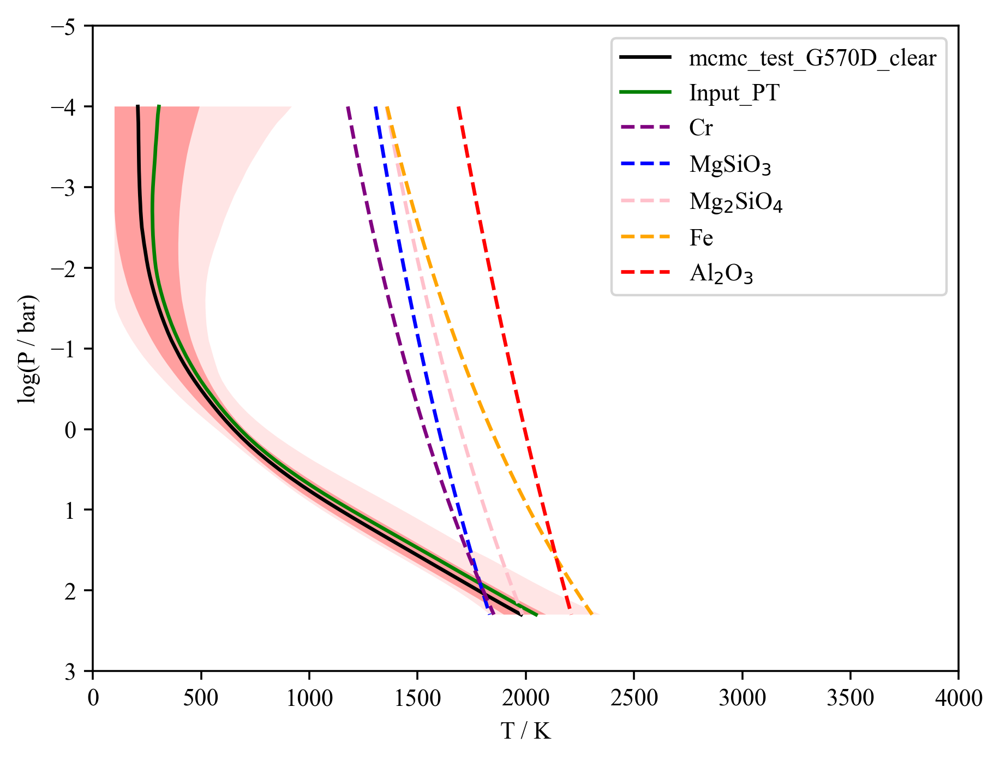

In [55]:
plt.rc('font',family='Times New Roman')
fig=plt.figure(dpi=320)
plt.axis([0., 4000.,3.0,-5.0])

logP = np.log10(runargs.press)

d1, = plt.plot(Tlays[:,2],logP,'k-',label=runname)
plt.fill_betweenx(logP,Tlays[:,1], Tlays[:,3], facecolor='red', alpha=0.3)
plt.fill_betweenx(logP,Tlays[:,0], Tlays[:,4], facecolor='red', alpha=0.1)

# Here are some condensation curves
enst = 10.0**4/(6.26 - 0.35*logP-0.70*0.0)
fost = 10.0**4/(5.89 - 0.37*logP-0.73*0.0)
iron = 10.0**4/(5.44 - 0.48*logP-0.48*0.0)
cr =  10.0**4/(6.528 - 0.491*logP-0.491*0.0)
al2o3 = 10.0**4 / (5.0139 - 0.21794*(logP) + 2.2636E-03*(logP)**2.0 - 0.580*0.0)
c1, = plt.plot(enst,logP,'--',color='blue',linewidth=1.5, label='MgSiO$_3$')
c2, = plt.plot(fost,logP,'--',color='pink',linewidth=1.5,label='Mg$_2$SiO$_4$')
c3, = plt.plot(iron,logP,'--',color='orange',linewidth=1.5, label='Fe')
c4, = plt.plot(cr,logP,'--',color='purple',linewidth=1.5, label='Cr')
c5, = plt.plot(al2o3,logP,'--',color='red',linewidth=1.5, label='Al$_2$O$_3$')

plt.legend(handles=[d1,c4,c1,c2,c3,c5])
plt.ylabel(r'log(P / bar)')
plt.xlabel('T / K')


In [63]:
D = 3.086e+16 * model_config_instance.dist
R = -1.0

r2d2_index=params_instance._fields.index('r2d2')
r2d2 =theta_max_end[r2d2_index]


logg_index=params_instance._fields.index('logg')
logg =theta_max_end[logg_index]


if (r2d2 > 0.):
    R = np.sqrt(r2d2) * D
g = (10.**logg)/100.
M = (R**2 * g/(6.67E-11))/1.898E27
Rj = R / 69911.e3
print(Rj)

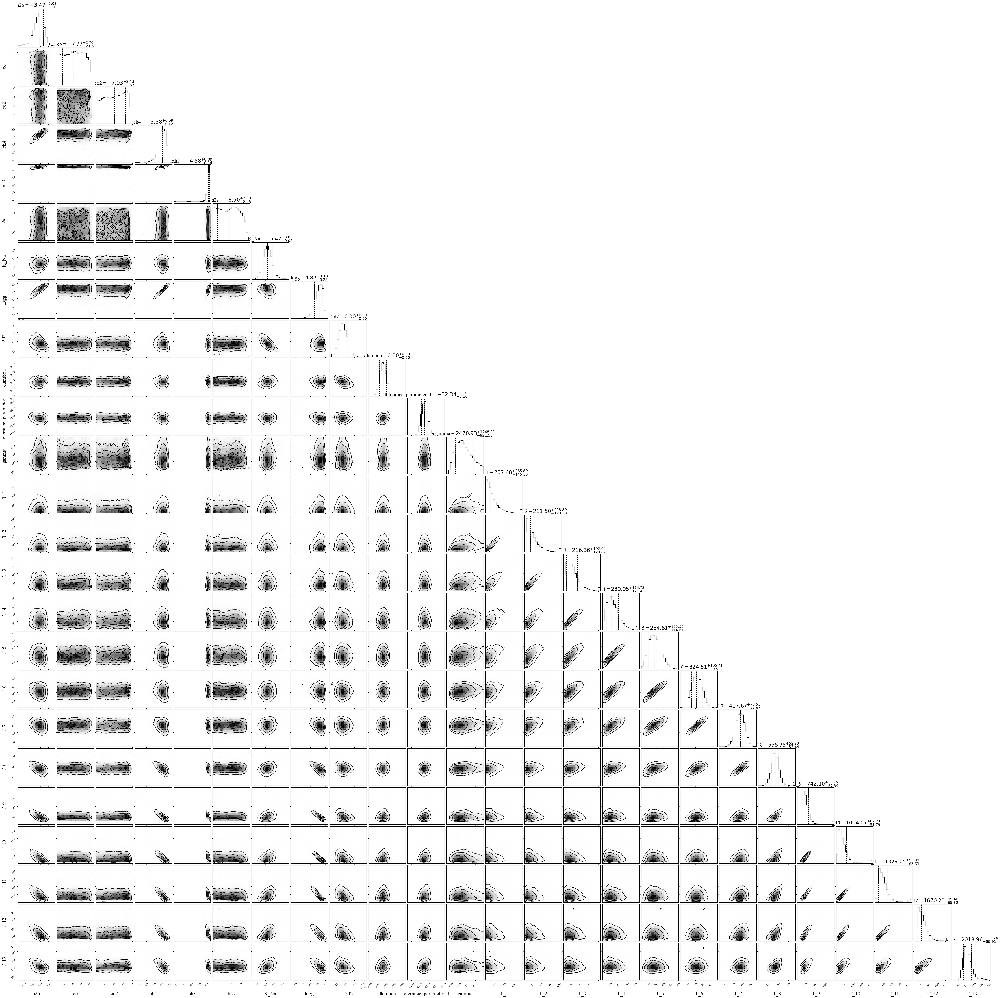

In [65]:
fig = corner.corner(samples,scale_hist=False,plot_datapoints =False,\
                    labels=all_params,\
                    quantiles=[0.16, 0.5, 0.84],show_titles=True, title_kwargs={"fontsize": 20},\
                    label_kwargs={"fontsize": 20})

In [61]:
#get diagnostics along with the spectrum
gnostics = 0
# Now run the model again to get your model spectrum and process to make it look like the data
shiftspec, photspec, tauspec,cfunc = test_module.modelspec(theta_max_end,re_params,runargs,gnostics)
topspec = brewtools.proc_spec(shiftspec,theta_max_end,runargs.fwhm,runargs.chemeq,runargs.gasnum,runargs.obspec) 

In [62]:
# Now grab 500 random draws from the posterior
pltspec = np.zeros((500,runargs.obspec[0,:].size))
samp= np.empty(ndim)
samples = flatendchain
sid = np.zeros(500)
for i in range (0,500):
    sid[i]= np.random.randint(0,high = len(samples))
    samp = samples[int(sid[i]),:]
    
    shiftspec, photspec, tauspec,cfunc = test_module.modelspec(samp,re_params,runargs,gnostics)
    pltspec[i,:] = brewtools.proc_spec(shiftspec,samp,runargs.fwhm,runargs.chemeq,runargs.gasnum,runargs.obspec) 

# get the intervals for the distribution of model spectra
specdist = np.empty([runargs.obspec[0].size,5])
for i in range(0,runargs.obspec[0].size):
    junk = pltspec[:,i]
    junk2 = np.percentile(junk, [2.4,16, 50, 84,97.6],axis=0)
    junk3 = np.array(junk2)
    specdist[i,:] = junk3[:]


Text(0.5, 0, 'Wavelength / $\\mu m$')

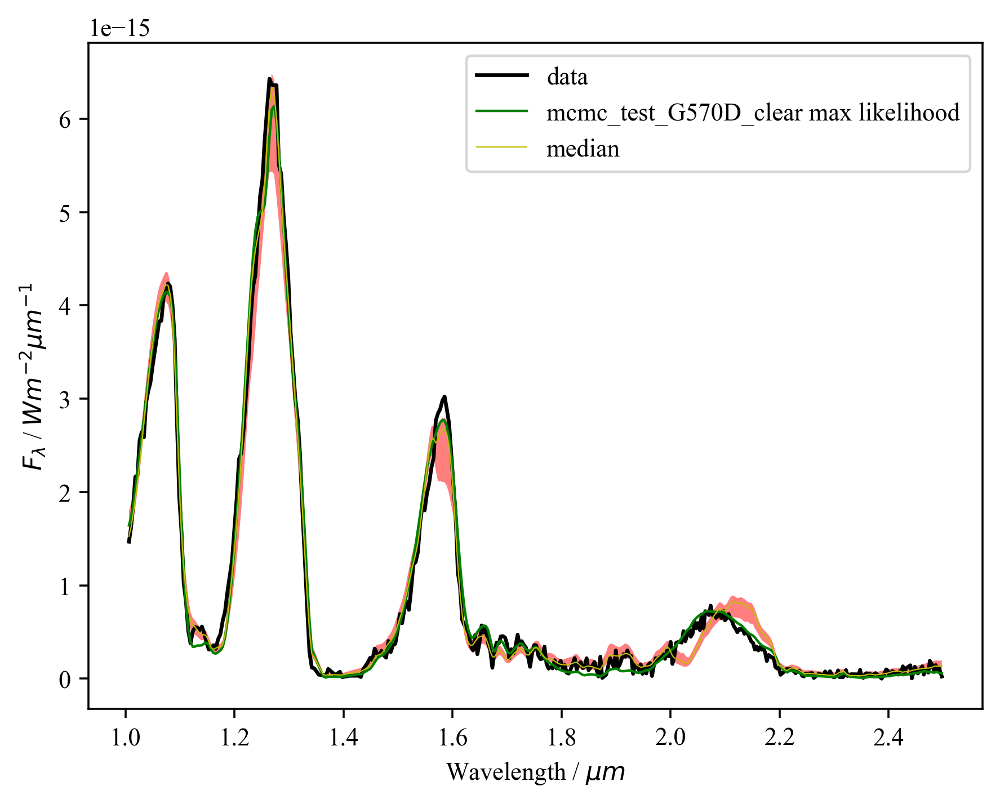

In [64]:
# plot the spectra
plt.rc('font',family='Times New Roman')
fig=plt.figure(dpi=320)


d1, = plt.plot(runargs.obspec[0,:],runargs.obspec[1,:],'k-',label = "data")
t1, = plt.plot(runargs.obspec[0,:],topspec,'g-',linewidth=1, label = runname+" max likelihood")

r1, = plt.plot(runargs.obspec[0],specdist[:,2],'y-',linewidth=0.5, label = "median")
#plt.fill_between(obspec[0],specdist[:,0],specdist[:,4],facecolor='red',alpha=0.2)
plt.fill_between(runargs.obspec[0],specdist[:,1],specdist[:,3],facecolor='red',alpha=0.5)
#plt.fill_between(obspec[0,:],obspec[1,:]-obspec[2,:],obspec[1,:]+obspec[2,:],facecolor='red',alpha=0.2)


plt.legend(handles=[d1,t1,r1])


plt.ylabel(r'$ F_{\lambda}$ / $Wm^{-2} \mu m^{-1}$')
plt.xlabel('Wavelength / $\mu m$')
#plt.savefig(runname+"_SPAG_SPEC.png",format='png', dpi=320))

# Multinest

In [ ]:
from pymultinest.analyse import Analyzer

path = "/Users/fw23aao/brewsteretrieval/brewster/multinest_test_G570D/"
runname ="multinest_test_G570D_clear"

argfile =path+runname+"_runargs.pic"
runargs = brewtools.pickle_load(argfile)
settings.init(runargs)

with open(path+runname+'_configs.pkl', 'rb') as file:
    configs= pickle.load(file)
    
re_params=configs['re_params']

all_params,all_params_values =utils.get_all_parametres(re_params.dictionary) 
ndim=len(all_params)

a = Analyzer(ndim, outputfiles_basename = path+runname)
stats = a.get_stats()
bestfit_params = a.get_best_fit()
print(bestfit_params)

  analysing data from /Users/fw23aao/brewsteretrieval/brewster/multinest_test_G570D/multinest_test_G570D_clear.txt
{'log_likelihood': 4321.771034265244, 'parameters': [-3.505788829817188, -6.845657952643288, -7.32548773846404, -3.4225332344478283, -4.616258998892692, -9.494144396035312, -5.479395930005942, 36.37244206335436, 1.2398661952111454, 0.001519234582423503, -32.36779102787496, 1122.8948124020199, 226.65568885358178, 182.41247541117033, 168.0447583493462, 185.44136949375113, 232.87191610700384, 300.12251010231876, 396.92774029031915, 554.6366657417223, 757.9907611073378, 1021.537090883159, 1350.853614074367, 1691.1074609697741, 2067.7306089569947]}


In [20]:
theta_max = np.array(bestfit_params['parameters'])
max_like = bestfit_params['log_likelihood']
tmp = a.get_equal_weighted_posterior()
samples = tmp[:,:(tmp.shape[1]-1)]

In [ ]:
params_master = namedtuple('params',all_params)
params_instance = params_master(*theta_max)

intemp_keys = list(re_params.dictionary['pt']['params'].keys())

if runargs.proftype==1 or runargs.proftype==77:
    p_index_first=params_instance._fields.index(intemp_keys[1]) 
else:
    p_index_first=params_instance._fields.index(intemp_keys[0]) 
    
p_index_last=params_instance._fields.index(intemp_keys[-1]) 

Tsamples = samples[:,p_index_first:p_index_last]
nsamps = Tsamples.shape[0]
nlayers = len(runargs.press)
Tprofs = np.empty([64,Tsamples.shape[0]])
for i in range(0,nsamps):
    Tprofs[:,i] = TPmod.set_prof(runargs.proftype,runargs.coarsePress,runargs.press,Tsamples[i,:])
    
Tlays = np.empty([nlayers,5])
for i in range(0,nlayers):
    junk = Tprofs[i,:]
    junk2 = np.percentile(junk, [2.4,16, 50, 84,97.6],axis=0)
    junk3 = np.array(junk2)
    Tlays[i,:] = junk3[:]

Text(0.5, 0, 'T / K')

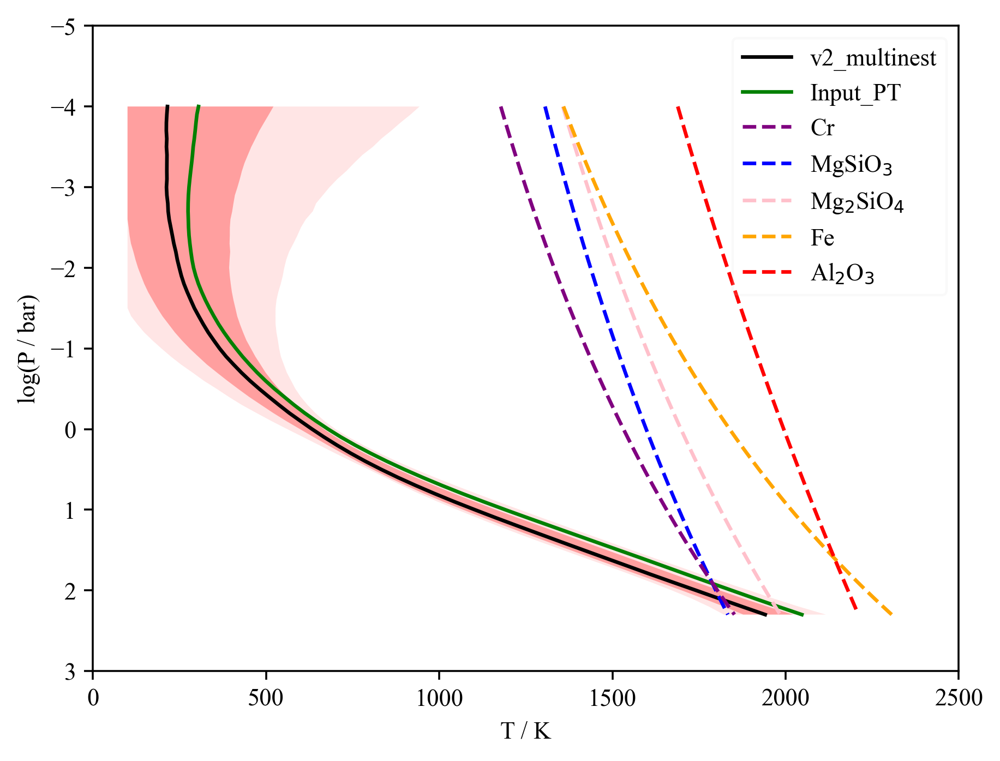

In [28]:
plt.rc('font',family='Times New Roman')
fig=plt.figure(dpi=320)
plt.axis([0., 2500.,3.0,-5.0])

logP = np.log10(runargs.press)

d1, = plt.plot(Tlays[:,2],logP,'k-',label=r"v2_multinest")
plt.fill_betweenx(logP,Tlays[:,1], Tlays[:,3], facecolor='red', alpha=0.3)
plt.fill_betweenx(logP,Tlays[:,0], Tlays[:,4], facecolor='red', alpha=0.1)


# Here are some condensation curves
enst = 10.0**4/(6.26 - 0.35*logP-0.70*0.0)
fost = 10.0**4/(5.89 - 0.37*logP-0.73*0.0)
iron = 10.0**4/(5.44 - 0.48*logP-0.48*0.0)
cr =  10.0**4/(6.528 - 0.491*logP-0.491*0.0)
al2o3 = 10.0**4 / (5.0139 - 0.21794*(logP) + 2.2636E-03*(logP)**2.0 - 0.580*0.0)
c1, = plt.plot(enst,logP,'--',color='blue',linewidth=1.5, label='MgSiO$_3$')
c2, = plt.plot(fost,logP,'--',color='pink',linewidth=1.5,label='Mg$_2$SiO$_4$')
c3, = plt.plot(iron,logP,'--',color='orange',linewidth=1.5, label='Fe')
c4, = plt.plot(cr,logP,'--',color='purple',linewidth=1.5, label='Cr')
c5, = plt.plot(al2o3,logP,'--',color='red',linewidth=1.5, label='Al$_2$O$_3$')

# plt.legend(handles=[d1,d2,c4,c1,c2,c3,c5])

plt.legend(handles=[d1,c4,c1,c2,c3,c5],framealpha=0.1)
plt.ylabel(r'log(P / bar)')
plt.xlabel('T / K')

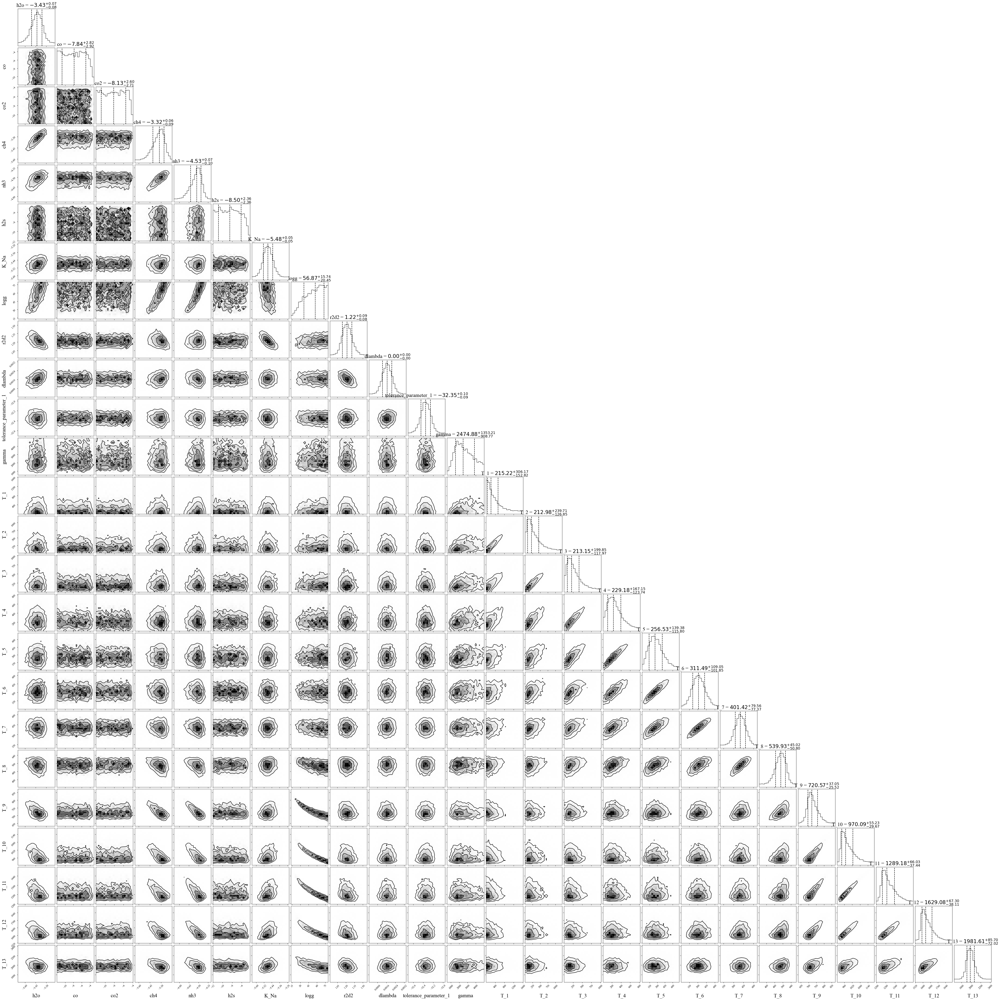

In [25]:
fig = corner.corner(samples,scale_hist=True,plot_datapoints =False,labels=all_params,\
                    quantiles=[0.16, 0.5, 0.84],show_titles=True, title_kwargs={"fontsize": 20},\
                    label_kwargs={"fontsize": 20})